In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import gc

gc.collect()

80

In [3]:
from huggingface_hub import login
import os

token_file_path = 'secrets.txt'

if os.path.exists(token_file_path):
    try:
        with open(token_file_path, 'r') as f:
            hf_token = f.read().strip()  # .strip() removes any leading/trailing whitespace

        login(token=hf_token)
        print("Successfully logged in to Hugging Face!")

    except Exception as e:
        print(f"An error occurred while trying to read the token file or log in: {e}")
else:
    print(f"Token file not found at {token_file_path}. Please create the file and add your token.")

/home/jovyan/.local/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Successfully logged in to Hugging Face!


In [4]:
from src.data_utils import SIFT50MDataset
import os
from datasets import load_dataset, Dataset

'''sift_dataset = load_dataset(
    'amazon-agi/SIFT-50M',
    #name='closed_ended_comparison',
    name = 'closed_ended_content_level',
    split='train',
    trust_remote_code=True
)'''

sift_dataset_test = load_dataset(
    'amazon-agi/SIFT-50M',
    #name='closed_ended_comparison',
    name = 'closed_ended_content_level',
    split='EvalSIFT',
    trust_remote_code=True
) 

# Define the allowed data sources
allowed_values = ["common_voice_de", "common_voice_en", "vctk_en"]

# Define a filter function
def filter_data_source(example):
    return example["data_source"] in allowed_values

#filtered_sift_data = sift_dataset.filter(filter_data_source)
filtered_sift_data_test = sift_dataset_test.filter(filter_data_source)

#df = sift_dataset.select(range(1000)).to_pandas()
#print(len(filtered_sift_data))
print(len(filtered_sift_data_test))
#filtered_df = df[df["data_source"].isin(allowed_values)]

# Count number of entries per value
#counts = filtered_df["data_source"].value_counts()
#print(counts)
#sift_data = Dataset.from_pandas(filtered_df)
# Define the base datasets paths (replace with your actual paths)

'''print('Training set')
counts = filtered_sift_data.to_pandas()["data_source"].value_counts()
print(counts)
print('Evaluation set')
counts = filtered_sift_data_eval.to_pandas()["data_source"].value_counts()'''


601


'print(\'Training set\')\ncounts = filtered_sift_data.to_pandas()["data_source"].value_counts()\nprint(counts)\nprint(\'Evaluation set\')\ncounts = filtered_sift_data_eval.to_pandas()["data_source"].value_counts()'

In [5]:
import pandas as pd

csv_de = pd.read_csv('./data/common_voice_de_eval_mapping.csv')
filtered_mask=csv_de['audio_path'].str.contains('common_voice_de_17733078')

print(csv_de[filtered_mask])

Empty DataFrame
Columns: [Unnamed: 0, id, audio_path]
Index: []


In [15]:
dataset = load_dataset("mozilla-foundation/common_voice_15_0", 'en', split="train", trust_remote_code=True)
print(len(dataset))

1070066


In [6]:
base_datasets_root = "/home/jovyan/.cache/huggingface/datasets"
base_datasets_paths = {
    "common_voice_de": None, # No longer needs a path, handled by load_dataset
    #"multilingual_librispeech_de": None, # No longer needs a path, handled by load_dataset
    "common_voice_en": None, # No longer needs a path, handled by load_dataset
    "vctk_en": "./vctk_corpus" # VCTK still needs a root path for torchaudio
}

In [7]:
sift_iterable_dataset_eval = SIFT50MDataset(sift_dataset=filtered_sift_data_test, base_datasets_paths=base_datasets_paths, test_set=True)

for x in sift_iterable_dataset_eval:
    print(x)
    break

{'id': 'common_voice_de_25543288', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25543288.mp3', 'type': 'audio'}, {'text': 'Ist das Audio für ein erwachsenes Publikum geeignet?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Ja, das Audio ist für ein erwachsenes Publikum geeignet.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


# Clean Audio

## audio doesn't exist for some samples

In [8]:
import random
from IPython.display import Audio, display

num_samples = 7
samples = [example for _, example in zip(range(num_samples), sift_iterable_dataset_eval)]

for idx, sample in enumerate(samples):
    print(f"\nSample {idx+1}:")
    for message in sample.get("messages", []):
        audio_text = None
        audio_path = None
        print(message)
        # Extract audio and its associated text safely
        for item in message.get("content", []):
            item_type = item.get("type")
            if item_type == "audio" and item.get("audio_path"):
                audio_path = item.get("audio_path")
            elif item_type == "text" and item.get("text"):
                audio_text = item.get("text")
        
        # text 
        if audio_text:
            print("Text:", audio_text)
        # audio
        if audio_path:
            display(Audio(audio_path))



Sample 1:
{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25543288.mp3', 'type': 'audio'}, {'text': 'Ist das Audio für ein erwachsenes Publikum geeignet?', 'audio_path': None, 'type': 'text'}]}
Text: Ist das Audio für ein erwachsenes Publikum geeignet?


{'role': 'assistant', 'content': [{'text': 'Ja, das Audio ist für ein erwachsenes Publikum geeignet.', 'audio_path': None}]}

Sample 2:
{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24978926.mp3', 'type': 'audio'}, {'text': 'Um wie viele Uhr spielt die Frau in der Audiodatei über den Canal de la Marne au Rhin und die Bahnlinie Straßburg-Metz?', 'audio_path': None, 'type': 'text'}]}
Text: Um wie viele Uhr spielt die Frau in der Audiodatei über den Canal de la Marne au Rhin und die Bahnlinie Straßburg-Metz?


{'role': 'assistant', 'content': [{'text': 'Leider kann ich aus der Audio-Datei nicht hören, um wie viele Uhr die Frau spricht. Die Metadaten enthalten diese Information nicht.', 'audio_path': None}]}

Sample 3:
{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17848124.mp3', 'type': 'audio'}, {'text': 'Was steht auf dem Pannenstreifen, das der Sprecher im Audioclip erwähnt?', 'audio_path': None, 'type': 'text'}]}
Text: Was steht auf dem Pannenstreifen, das der Sprecher im Audioclip erwähnt?


{'role': 'assistant', 'content': [{'text': 'Auf dem Pannenstreifen steht ein defekter LKW.', 'audio_path': None}]}

Sample 4:
{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19114882.mp3', 'type': 'audio'}, {'text': 'Ist die Stimme auf dem Audioclip weiblich oder männlich?', 'audio_path': None, 'type': 'text'}]}
Text: Ist die Stimme auf dem Audioclip weiblich oder männlich?


{'role': 'assistant', 'content': [{'text': 'Die Stimme ist männlich.', 'audio_path': None}]}

Sample 5:
{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20136657.mp3', 'type': 'audio'}, {'text': 'In welchem Akzent spricht die Person auf dem Audioclip?', 'audio_path': None, 'type': 'text'}]}
Text: In welchem Akzent spricht die Person auf dem Audioclip?


{'role': 'assistant', 'content': [{'text': 'Die Person spricht mit einem deutschen Akzent aus Deutschland.', 'audio_path': None}]}

Sample 6:
{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23596171.mp3', 'type': 'audio'}, {'text': 'Ist das Audio für ein männliches oder weibliches Publikum bestimmt?', 'audio_path': None, 'type': 'text'}]}
Text: Ist das Audio für ein männliches oder weibliches Publikum bestimmt?


{'role': 'assistant', 'content': [{'text': 'Das Audio ist für ein männliches Publikum bestimmt.', 'audio_path': None}]}

Sample 7:
{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_22904309.mp3', 'type': 'audio'}, {'text': 'In welchem Alterskategorie fällt der Sprecher des Audios?', 'audio_path': None, 'type': 'text'}]}
Text: In welchem Alterskategorie fällt der Sprecher des Audios?


{'role': 'assistant', 'content': [{'text': "Der Sprecher fällt in die Alterskategorie 'zwanziger'.", 'audio_path': None}]}


# Noise Audio

In [9]:
from datasets import load_dataset
from IPython.display import Audio

# MUSAN noise dataset 
dataset = load_dataset("bilguun/musan-noise", split="train", streaming=True)

for idx, example in enumerate(dataset.take(3)):
    audio_dict = example["audio"]  
    waveform = audio_dict["array"] 
    sampling_rate = audio_dict["sampling_rate"] # 16000
    
    print(f"Sample {idx+1}:")
    display(Audio(waveform, rate=sampling_rate))


Sample 1:


Sample 2:


Sample 3:


# Added Noise to one sample

/home/jovyan/.local/opt/conda/envs/ainmc/lib/python3.11/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/home/jovyan/.local/opt/conda/envs/ainmc/lib/python3.11/site-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/

Clean Audio:


Noisy Audio @ 0 dB SNR:


Noisy Audio @ 10 dB SNR:


Noisy Audio @ 20 dB SNR:


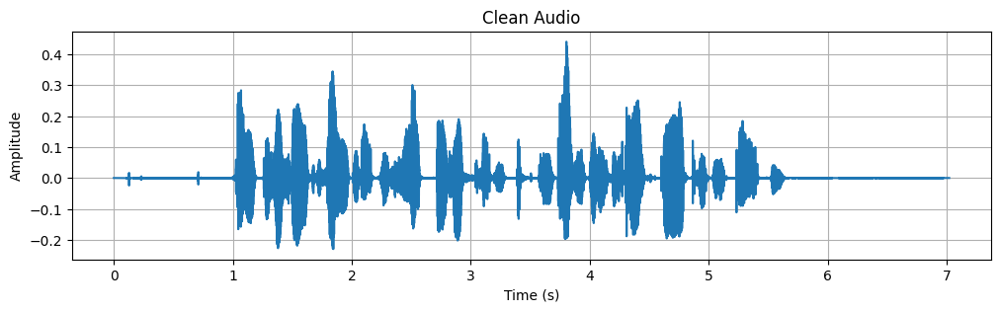

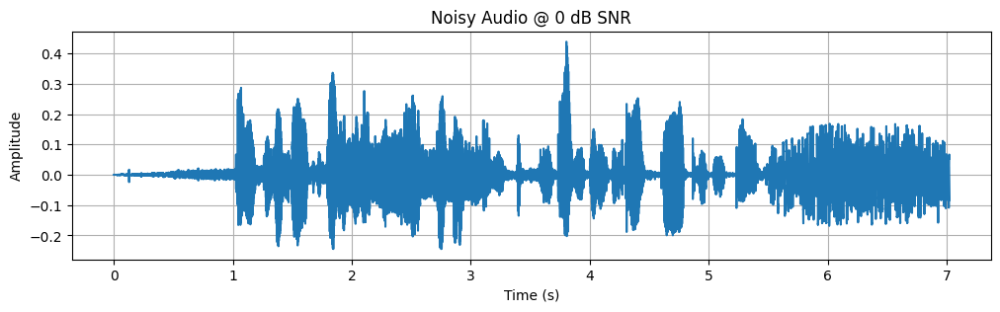

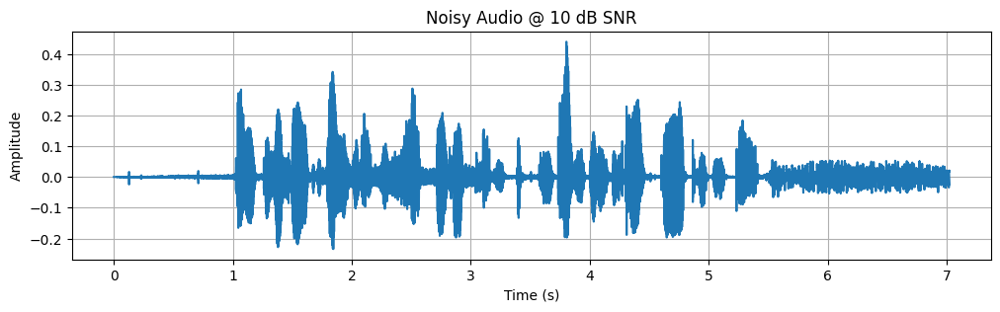

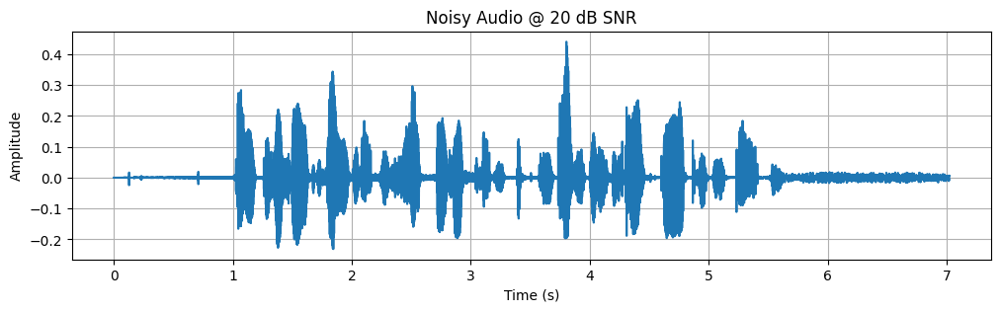

In [10]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import torchaudio
import torchaudio.functional as F
from datasets import load_dataset
from IPython.display import Audio, display

# one clean sample

sample = next(iter(sift_iterable_dataset_eval))  
speech_path = None

for message in sample.get("messages", []):
    for item in message.get("content", []):
        if item.get("type") == "audio" and item.get("audio_path"):
            speech_path = item.get("audio_path")
            break
    if speech_path:
        break

if speech_path is None:
    raise ValueError("No audio found in the sample!")

# clean audio
speech, sr = torchaudio.load(speech_path)
if speech.size(0) > 1:  # convert to mono if needed
    speech = torch.mean(speech, dim=0, keepdim=True)

# one noise sample from MUSAN

noise_dataset = load_dataset("bilguun/musan-noise", split="train", streaming=True)
noise_sample = next(iter(noise_dataset))
noise_waveform = torch.tensor(noise_sample["audio"]["array"], dtype=torch.float32).unsqueeze(0)
noise_sr = noise_sample["audio"]["sampling_rate"]

# Resample if needed
if noise_sr != sr:
    resampler = torchaudio.transforms.Resample(orig_freq=noise_sr, new_freq=sr)
    noise_waveform = resampler(noise_waveform)

if noise_waveform.size(1) < speech.size(1):
    repeats = (speech.size(1) // noise_waveform.size(1)) + 1
    noise_waveform = noise_waveform.repeat(1, repeats)
noise_waveform = noise_waveform[:, :speech.size(1)]

# noise at different SNRs using torchaudio.functional.add_noise
# Reference: https://docs.pytorch.org/audio/stable/tutorials
#/audio_data_augmentation_tutorial.html#background-noise
snr_dbs = torch.tensor([0, 10, 20])  # multiple SNRs
noisy_speeches = F.add_noise(speech, noise_waveform, snr_dbs)  

print("Clean Audio:")
display(Audio(speech.squeeze().numpy(), rate=sr))

for i, snr in enumerate(snr_dbs):
    print(f"Noisy Audio @ {snr.item()} dB SNR:")
    display(Audio(noisy_speeches[i].squeeze().numpy(), rate=sr))

    def plot_waveform(waveform, sr, title="Waveform"):
        waveform = waveform.squeeze().numpy()
        time_axis = np.arange(len(waveform)) / sr
        plt.figure(figsize=(12, 3))
        plt.plot(time_axis, waveform)
        plt.title(title)
        plt.xlabel("Time (s)")
        plt.ylabel("Amplitude")
        plt.grid(True)
        plt.show()

plot_waveform(speech, sr, title="Clean Audio")

for i, snr in enumerate(snr_dbs):
    plot_waveform(noisy_speeches[i], sr, title=f"Noisy Audio @ {snr.item()} dB SNR")

# Noise added to full test set

In [11]:
import os
import torch
import torchaudio
import torchaudio.functional as F
from tqdm import tqdm
from datasets import load_dataset

output_dir = "./data/eval_audio_dataset"
os.makedirs(output_dir, exist_ok=True)

# SNR levels
snr_levels = torch.tensor([0, 10, 20])

noise_dataset = load_dataset("bilguun/musan-noise", split="train", streaming=True)
noise_iter = iter(noise_dataset)  

for idx, clean_sample in enumerate(tqdm(sift_iterable_dataset_eval, desc="Processing clean samples")):

    speech_path = None
    for message in clean_sample.get("messages", []):
        for item in message.get("content", []):
            if item.get("type") == "audio" and item.get("audio_path"):
                speech_path = item.get("audio_path")
                break
        if speech_path:
            break

    if speech_path is None:
        continue  # skip if no audio found

    speech, sr = torchaudio.load(speech_path)
    if speech.size(0) > 1:
        speech = torch.mean(speech, dim=0, keepdim=True)  # convert to mono

    # Save clean audio
    clean_filename = os.path.join(output_dir, f"sample_{idx}_clean.wav")
    torchaudio.save(clean_filename, speech, sr)

    noise_sample = next(noise_iter)
    noise_array = noise_sample["audio"]["array"]
    noise_sr = noise_sample["audio"]["sampling_rate"]
    noise = torch.tensor(noise_array, dtype=torch.float32).unsqueeze(0)

    # resample 
    if noise_sr != sr:
        resampler = torchaudio.transforms.Resample(orig_freq=noise_sr, new_freq=sr)
        noise = resampler(noise)
        noise_sr = sr

    speech_len = speech.size(1)
    noise_len = noise.size(1)
    if noise_len < speech_len:
        repeat_factor = (speech_len // noise_len) + 1
        noise = noise.repeat(1, repeat_factor)
    noise = noise[:, :speech_len]  

    
    # noise at multiple SNRs
    noisy_speeches = F.add_noise(speech, noise, snr_levels)  

    # Save noisy audios
    for i, snr in enumerate(snr_levels):
        noisy = noisy_speeches[i]
        if noisy.dim() == 1:
            noisy = noisy.unsqueeze(0)
        noisy = noisy.to(torch.float32)
        noisy_filename = os.path.join(output_dir, f"sample_{idx}_noisy_{snr}dB.wav")
        torchaudio.save(noisy_filename, noisy, sr, channels_first=True)


Processing clean samples: 0it [00:00, ?it/s]/home/jovyan/.local/opt/conda/envs/ainmc/lib/python3.11/site-packages/torchaudio/_backend/utils.py:337: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.save_with_torchcodec` under the hood. Some parameters like format, encoding, bits_per_sample, buffer_size, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's encoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.encoders.AudioEncoder
  warnings.warn(
/home/jovyan/.local/opt/conda/envs/ainmc/lib/python3.11/site-packages/torchaudio/_backend/ffmpeg.py:247: UserWarning: torio.io._streaming_media_encoder.StreamingMediaEncoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://g

# Random clean and noise samples from the saved noisy data

In [12]:
import random
from IPython.display import Audio, display
import torchaudio

output_dir = "./data/eval_audio_dataset"

all_files = [f for f in os.listdir(output_dir) if f.endswith(".wav")]

# 5 random samples
sample_files = random.sample(all_files, 5)

for f in sample_files:
    file_path = os.path.join(output_dir, f)
    waveform, sr = torchaudio.load(file_path)
    print(f"Playing: {f} | Sample rate: {sr} Hz")
    display(Audio(waveform.squeeze().numpy(), rate=sr))

Playing: sample_350_clean.wav | Sample rate: 48000 Hz


Playing: sample_73_noisy_0dB.wav | Sample rate: 32000 Hz


Playing: sample_340_noisy_10dB.wav | Sample rate: 48000 Hz


Playing: sample_22_noisy_20dB.wav | Sample rate: 48000 Hz


Playing: sample_30_noisy_10dB.wav | Sample rate: 32000 Hz
